In [1]:
import os
from PIL import Image
import numpy as np
import tensorflow as tf


RESHAPE = (512, 512)

def is_an_image_file(filename):
    IMAGE_EXTENSIONS = ['.png', '.jpg', '.jpeg']
    for ext in IMAGE_EXTENSIONS:
        if ext in filename:
            return True
    return False


def list_image_files(directory):
    files = sorted(os.listdir(directory))
    return [os.path.join(directory, f) for f in files if is_an_image_file(f)]


def load_image(path):
    img = Image.open(path)
    return img


def preprocess_image(cv_img):
    cv_img = cv_img.resize(RESHAPE)
    img = np.array(cv_img)
    img = (img - 127.5) / 127.5
    return img


def deprocess_image(img):
    img = img * 127.5 + 127.5
    return img.astype('uint8')


def save_image(np_arr, path):
    img = np_arr * 127.5 + 127.5
    im = Image.fromarray(img)
    im.save(path)


def load_images(path, n_images):
    if n_images < 0:
        n_images = float("inf")
    A_paths, B_paths = os.path.join(path, 'A'), os.path.join(path, 'B')
    all_A_paths, all_B_paths = list_image_files(A_paths), list_image_files(B_paths)
    images_A, images_B = [], []
    images_A_paths, images_B_paths = [], []
    for path_A, path_B in zip(all_A_paths, all_B_paths):
        img_A, img_B = load_image(path_A), load_image(path_B)
        images_A.append(preprocess_image(img_A))
        images_B.append(preprocess_image(img_B))
        images_A_paths.append(path_A)
        images_B_paths.append(path_B)
        if len(images_A) > n_images - 1: break

    return {
        'A': np.array(images_A),
        'A_paths': np.array(images_A_paths),
        'B': np.array(images_B),
        'B_paths': np.array(images_B_paths)
    }

def write_log(callback, names, logs, batch_no):
    """
    Util to write callback for Keras training
    """
    for name, value in zip(names, logs):
        summary = tf.Summary()
        summary_value = summary.value.add()
        summary_value.simple_value = value
        summary_value.tag = name
        callback.writer.add_summary(summary, batch_no)
        callback.writer.flush()

In [2]:
n_images = 2103
data = load_images('./GoproAB/train', n_images)

In [4]:
y_train, x_train = data['B'], data['A']

In [5]:
from matplotlib import pyplot as plt

In [6]:
from keras.layers import Input, Conv2D, Activation, BatchNormalization
from keras.layers.merge import Add
from keras.layers.core import Dropout

def res_block(input, filters, kernel_size=(3,3), strides=(1,1), use_dropout=False):
    """
    Instanciate a Keras Resnet Block using sequential API.
    :param input: Input tensor
    :param filters: Number of filters to use
    :param kernel_size: Shape of the kernel for the convolution
    :param strides: Shape of the strides for the convolution
    :param use_dropout: Boolean value to determine the use of dropout
    :return: Keras Model
    """
    x = ReflectionPadding2D((1,1))(input)
    x = Conv2D(filters=filters,
               kernel_size=kernel_size,
               strides=strides,)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if use_dropout:
        x = Dropout(0.5)(x)

    x = ReflectionPadding2D((1,1))(x)
    x = Conv2D(filters=filters,
                kernel_size=kernel_size,
                strides=strides,)(x)
    x = BatchNormalization()(x)

    # Two convolution layers followed by a direct connection between input and output
    merged = Add()([input, x])
    return merged

Using TensorFlow backend.


In [7]:
from keras.layers import Input, Activation, Add
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.core import Lambda
from keras.layers.normalization import BatchNormalization
from keras.models import Model

#from layer_utils import ReflectionPadding2D, res_block

ngf = 64
input_nc = 3
output_nc = 3
input_shape_generator = (512, 512, input_nc)
n_blocks_gen = 9


def generator_model():
    """Build generator architecture."""
    # Current version : ResNet block
    inputs = Input(shape=image_shape)

    x = ReflectionPadding2D((3, 3))(inputs)
    x = Conv2D(filters=ngf, kernel_size=(7,7), padding='valid')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Increase filter number
    n_downsampling = 2
    for i in range(n_downsampling):
        mult = 2**i
        x = Conv2D(filters=ngf*mult*2, kernel_size=(3,3), strides=2, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

    # Apply 9 ResNet blocks
    mult = 2**n_downsampling
    for i in range(n_blocks_gen):
        x = res_block(x, ngf*mult, use_dropout=True)

    # Decrease filter number to 3 (RGB)
    for i in range(n_downsampling):
        mult = 2**(n_downsampling - i)
        x = Conv2DTranspose(filters=int(ngf * mult / 2), kernel_size=(3,3), strides=2, padding='same')(x)
        x = BatchNormalization()(x)
        x = Activation('relu')(x)

    x = ReflectionPadding2D((3,3))(x)
    x = Conv2D(filters=output_nc, kernel_size=(7,7), padding='valid')(x)
    x = Activation('tanh')(x)

    # Add direct connection from input to output and recenter to [-1, 1]
    outputs = Add()([x, inputs])
    outputs = Lambda(lambda z: z/2)(outputs)

    model = Model(inputs=inputs, outputs=outputs, name='Generator')
    return model

In [8]:
from keras.layers import Input
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D
from keras.layers.core import Dense, Flatten
from keras.layers.normalization import BatchNormalization
from keras.models import Model

ndf = 64
output_nc = 3
input_shape_discriminator = (512, 512, output_nc)


def discriminator_model():
    """Build discriminator architecture."""
    n_layers, use_sigmoid = 3, False
    inputs = Input(shape=input_shape_discriminator)

    x = Conv2D(filters=ndf, kernel_size=(4,4), strides=2, padding='same')(inputs)
    x = LeakyReLU(0.2)(x)
    x = Dense(512, activation='tanh')(x)
    nf_mult, nf_mult_prev = 1, 1
    for n in range(n_layers):
        nf_mult_prev, nf_mult = nf_mult, min(2**n, 8)
        x = Conv2D(filters=ndf*nf_mult, kernel_size=(4,4), strides=2, padding='same')(x)
        x = BatchNormalization()(x)
        x = LeakyReLU(0.2)(x)

    nf_mult_prev, nf_mult = nf_mult, min(2**n_layers, 8)
    x = Conv2D(filters=ndf*nf_mult, kernel_size=(4,4), strides=1, padding='same')(x)
    x = Dense(nf_mult, activation='tanh')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Conv2D(filters=1, kernel_size=(4,4), strides=1, padding='same')(x)
    
    if use_sigmoid:
        x = Activation('sigmoid')(x)
        
    x = Flatten()(x)
    x = Dense(1024, activation='tanh')(x)
    x = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=inputs, outputs=x, name='Discriminator')
    return model

In [9]:
from keras.layers import Input
from keras.models import Model

def generator_containing_discriminator_multiple_outputs(generator, discriminator):
    inputs = Input(shape=image_shape)
    generated_images = generator(inputs)
    outputs = discriminator(generated_images)
    model = Model(inputs=inputs, outputs=[generated_images, outputs])
    return model

In [10]:
import keras.backend as K
from keras.applications.vgg16 import VGG16
from keras.models import Model

image_shape = (512, 512, 3)

def perceptual_loss(y_true, y_pred):
    vgg = VGG16(include_top=False, weights='imagenet', input_shape=image_shape)
    loss_model = Model(inputs=vgg.input, outputs=vgg.get_layer('block3_conv3').output)
    loss_model.trainable = False
    return K.mean(K.square(loss_model(y_true) - loss_model(y_pred)))
  
import keras.backend as K

def wasserstein_loss(y_true, y_pred):
    return K.mean(y_true*y_pred)

In [11]:
from keras.engine.topology import Layer
from keras.utils import conv_utils

class ReflectionPadding2D(Layer):
    """Reflection-padding layer for 2D input (e.g. picture).
    This layer can add rows and columns or zeros
    at the top, bottom, left and right side of an image tensor.
    # Arguments
        padding: int, or tuple of 2 ints, or tuple of 2 tuples of 2 ints.
            - If int: the same symmetric padding
                is applied to width and height.
            - If tuple of 2 ints:
                interpreted as two different
                symmetric padding values for height and width:
                `(symmetric_height_pad, symmetric_width_pad)`.
            - If tuple of 2 tuples of 2 ints:
                interpreted as
                `((top_pad, bottom_pad), (left_pad, right_pad))`
        data_format: A string,
            one of `channels_last` (default) or `channels_first`.
            The ordering of the dimensions in the inputs.
            `channels_last` corresponds to inputs with shape
            `(batch, height, width, channels)` while `channels_first`
            corresponds to inputs with shape
            `(batch, channels, height, width)`.
            It defaults to the `image_data_format` value found in your
            Keras config file at `~/.keras/keras.json`.
            If you never set it, then it will be "channels_last".
    # Input shape
        4D tensor with shape:
        - If `data_format` is `"channels_last"`:
            `(batch, rows, cols, channels)`
        - If `data_format` is `"channels_first"`:
            `(batch, channels, rows, cols)`
    # Output shape
        4D tensor with shape:
        - If `data_format` is `"channels_last"`:
            `(batch, padded_rows, padded_cols, channels)`
        - If `data_format` is `"channels_first"`:
            `(batch, channels, padded_rows, padded_cols)`
    """

    def __init__(self,
                 padding=(1, 1),
                 data_format=None,
                 **kwargs):
        super(ReflectionPadding2D, self).__init__(**kwargs)
        self.data_format = normalize_data_format(data_format)
        if isinstance(padding, int):
            self.padding = ((padding, padding), (padding, padding))
        elif hasattr(padding, '__len__'):
            if len(padding) != 2:
                raise ValueError('`padding` should have two elements. '
                                 'Found: ' + str(padding))
            height_padding = conv_utils.normalize_tuple(padding[0], 2,
                                                        '1st entry of padding')
            width_padding = conv_utils.normalize_tuple(padding[1], 2,
                                                       '2nd entry of padding')
            self.padding = (height_padding, width_padding)
        else:
            raise ValueError('`padding` should be either an int, '
                             'a tuple of 2 ints '
                             '(symmetric_height_pad, symmetric_width_pad), '
                             'or a tuple of 2 tuples of 2 ints '
                             '((top_pad, bottom_pad), (left_pad, right_pad)). '
                             'Found: ' + str(padding))
        self.input_spec = InputSpec(ndim=4)

    def compute_output_shape(self, input_shape):
        if self.data_format == 'channels_first':
            if input_shape[2] is not None:
                rows = input_shape[2] + self.padding[0][0] + self.padding[0][1]
            else:
                rows = None
            if input_shape[3] is not None:
                cols = input_shape[3] + self.padding[1][0] + self.padding[1][1]
            else:
                cols = None
            return (input_shape[0],
                    input_shape[1],
                    rows,
                    cols)
        elif self.data_format == 'channels_last':
            if input_shape[1] is not None:
                rows = input_shape[1] + self.padding[0][0] + self.padding[0][1]
            else:
                rows = None
            if input_shape[2] is not None:
                cols = input_shape[2] + self.padding[1][0] + self.padding[1][1]
            else:
                cols = None
            return (input_shape[0],
                    rows,
                    cols,
                    input_shape[3])

    def call(self, inputs):
        return spatial_reflection_2d_padding(inputs,
                                             padding=self.padding,
                                             data_format=self.data_format)

In [12]:
from tensorflow.python.keras import backend

def normalize_data_format(value):
  if value is None:
    value = backend.image_data_format()
  data_format = value.lower()
  if data_format not in {'channels_first', 'channels_last'}:
    raise ValueError('The `data_format` argument must be one of '
                     '"channels_first", "channels_last". Received: ' +
                     str(value))
  return data_format

In [13]:
from keras.engine import InputSpec
from keras.optimizers import Adam

def spatial_reflection_2d_padding(x, padding=((1, 1), (1, 1)), data_format=None):
    """
    Pad the 2nd and 3rd dimensions of a 4D tensor.
    :param x: Input tensor
    :param padding: Shape of padding to use
    :param data_format: Tensorflow vs Theano convention ('channels_last', 'channels_first')
    :return: Tensorflow tensor
    """
    assert len(padding) == 2
    assert len(padding[0]) == 2
    assert len(padding[1]) == 2
    if data_format is None:
        data_format = image_data_format()
    if data_format not in {'channels_first', 'channels_last'}:
        raise ValueError('Unknown data_format ' + str(data_format))

    if data_format == 'channels_first':
        pattern = [[0, 0],
                   [0, 0],
                   list(padding[0]),
                   list(padding[1])]
    else:
        pattern = [[0, 0],
                   list(padding[0]), list(padding[1]),
                   [0, 0]]
    return tf.pad(x, pattern, "REFLECT")

In [14]:
# Initialize models
g = generator_model()
d = discriminator_model()
d_on_g = generator_containing_discriminator_multiple_outputs(g, d)

# Initialize optimizers
g_opt = Adam(lr=1E-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
d_opt = Adam(lr=1E-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
d_on_g_opt = Adam(lr=1E-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

# Compile models
d.trainable = True
d.compile(optimizer=d_opt, loss=wasserstein_loss)
d.trainable = False
loss = [perceptual_loss, wasserstein_loss]
loss_weights = [100, 1]
d_on_g.compile(optimizer=d_on_g_opt, loss=loss, loss_weights=loss_weights)
d.trainable = True

In [15]:
g.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
reflection_padding2d_1 (Reflect (None, 518, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 64) 9472        reflection_padding2d_1[0][0]     
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 64) 256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation

In [16]:
d.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 512, 512, 3)       0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 256, 256, 64)      3136      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256, 256, 64)      0         
_________________________________________________________________
dense_1 (Dense)              (None, 256, 256, 512)     33280     
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 128, 128, 64)      524352    
_________________________________________________________________
batch_normalization_24 (Batc (None, 128, 128, 64)      256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 128, 128, 64)      0         
__________

In [17]:
d_on_g.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 512, 512, 3)       0         
_________________________________________________________________
Generator (Model)            (None, 512, 512, 3)       11399171  
_________________________________________________________________
Discriminator (Model)        (None, 1)                 4370858   
Total params: 11,400,083
Trainable params: 11,388,675
Non-trainable params: 11,408
_________________________________________________________________


/home/pawinchiowanich/anaconda3/envs/cuda/lib/python3.5/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


In [18]:
epoch_num = 100
batches = 8
batch_size = 4
critic_updates = 10
output_true_batch, output_false_batch = np.ones((batch_size, 1)), -np.ones((batch_size, 1))

In [19]:
for epoch in range(epoch_num):
  print('epoch: {}/{}'.format(epoch, epoch_num))
  print('batches: {}'.format(x_train.shape[0] / batch_size))

  # Randomize images into batches
  permutated_indexes = np.random.permutation(x_train.shape[0])

  for index in range(int(x_train.shape[0] / batch_size)):
      batch_indexes = permutated_indexes[index*batch_size:(index+1)*batch_size]
      image_blur_batch = x_train[batch_indexes]
      image_full_batch = y_train[batch_indexes]

epoch: 0/100
batches: 525.75
epoch: 1/100
batches: 525.75
epoch: 2/100
batches: 525.75
epoch: 3/100
batches: 525.75
epoch: 4/100
batches: 525.75
epoch: 5/100
batches: 525.75
epoch: 6/100
batches: 525.75
epoch: 7/100
batches: 525.75
epoch: 8/100
batches: 525.75
epoch: 9/100
batches: 525.75
epoch: 10/100
batches: 525.75
epoch: 11/100
batches: 525.75
epoch: 12/100
batches: 525.75
epoch: 13/100
batches: 525.75
epoch: 14/100
batches: 525.75
epoch: 15/100
batches: 525.75
epoch: 16/100
batches: 525.75
epoch: 17/100
batches: 525.75
epoch: 18/100
batches: 525.75
epoch: 19/100
batches: 525.75
epoch: 20/100
batches: 525.75
epoch: 21/100
batches: 525.75
epoch: 22/100
batches: 525.75
epoch: 23/100
batches: 525.75
epoch: 24/100
batches: 525.75
epoch: 25/100
batches: 525.75
epoch: 26/100
batches: 525.75
epoch: 27/100
batches: 525.75
epoch: 28/100
batches: 525.75
epoch: 29/100
batches: 525.75
epoch: 30/100
batches: 525.75
epoch: 31/100
batches: 525.75
epoch: 32/100
batches: 525.75
epoch: 33/100
batche

In [20]:
from IPython.display import clear_output

In [21]:
d_loss_w = []
g_loss_p = []
g_loss_w = []
result = []
for epoch in range(epoch_num):
  
  for index in range(batches):
    #clear_output()
    print("at ",epoch+1,"/",epoch_num,"epoch")
    print("at index ",index+1)
    # [Batch Preparation]

    # Generate fake inputs
    generated_images = g.predict(x=image_blur_batch, batch_size=batch_size)
    
    # Train multiple times discriminator on real and fake inputs
    for _ in range(critic_updates):
        d_loss_real = d.train_on_batch(image_full_batch, output_true_batch)
        d_loss_fake = d.train_on_batch(generated_images, output_false_batch)
        d_loss = 0.5 * np.add(d_loss_fake, d_loss_real)
    print("wasserstein loss on train discriminator ",d_loss)

    d.trainable = False
    # Train generator only on discriminator's decision and generated images
    d_on_g_loss = d_on_g.train_on_batch(image_blur_batch, [image_full_batch, output_true_batch])
    print("perceptual loss on train generator",d_on_g_loss[0])
    print("wasserstein loss on train generator",d_on_g_loss[1])

    d.trainable = True
    
  d_loss_w.append(d_loss)
  g_loss_p.append(d_on_g_loss[0])
  g_loss_w.append(d_on_g_loss[1])
  result.append(generated_images[0])

at  1 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.3239026665687561
perceptual loss on train generator 6711.1104
wasserstein loss on train generator 67.105415
at  1 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.49928316473960876
perceptual loss on train generator 6295.763
wasserstein loss on train generator 62.94861
at  1 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.49987560510635376
perceptual loss on train generator 5895.85
wasserstein loss on train generator 58.950592
at  1 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.499898761510849
perceptual loss on train generator 5525.542
wasserstein loss on train generator 55.24623
at  1 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.49989619851112366
perceptual loss on train generator 5185.142
wasserstein loss on train generator 51.841957
at  1 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.4999033212661743
perc

wasserstein loss on train discriminator  -0.4999912977218628
perceptual loss on train generator 2108.913
wasserstein loss on train generator 21.079142
at  6 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.49999192357063293
perceptual loss on train generator 2095.801
wasserstein loss on train generator 20.948017
at  6 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.4999922811985016
perceptual loss on train generator 2086.2742
wasserstein loss on train generator 20.852749
at  7 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.49999210238456726
perceptual loss on train generator 2072.1272
wasserstein loss on train generator 20.71128
at  7 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.49999213218688965
perceptual loss on train generator 2061.7373
wasserstein loss on train generator 20.60738
at  7 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.49999257922172546
perceptual loss on train gene

wasserstein loss on train discriminator  -0.4999975562095642
perceptual loss on train generator 1697.9746
wasserstein loss on train generator 16.969746
at  12 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.49999764561653137
perceptual loss on train generator 1699.3307
wasserstein loss on train generator 16.983307
at  12 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.49999773502349854
perceptual loss on train generator 1690.394
wasserstein loss on train generator 16.89394
at  12 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.4999978244304657
perceptual loss on train generator 1687.6442
wasserstein loss on train generator 16.866442
at  12 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.4999977648258209
perceptual loss on train generator 1676.6985
wasserstein loss on train generator 16.756985
at  12 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.4999978542327881
perceptual loss on train

wasserstein loss on train discriminator  -0.49999913573265076
perceptual loss on train generator 1445.4913
wasserstein loss on train generator 14.444914
at  18 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.49999913573265076
perceptual loss on train generator 1447.6781
wasserstein loss on train generator 14.466781
at  18 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.49999916553497314
perceptual loss on train generator 1441.3711
wasserstein loss on train generator 14.40371
at  18 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.49999919533729553
perceptual loss on train generator 1432.8906
wasserstein loss on train generator 14.318906
at  18 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.4999992251396179
perceptual loss on train generator 1429.4003
wasserstein loss on train generator 14.284002
at  18 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.4999992251396179
perceptual loss on tr

wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on train generator 1275.212
wasserstein loss on train generator 12.74212
at  23 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on train generator 1270.2499
wasserstein loss on train generator 12.692498
at  23 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on train generator 1264.4742
wasserstein loss on train generator 12.634743
at  23 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on train generator 1261.718
wasserstein loss on train generator 12.60718
at  24 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on train generator 1255.9546
wasserstein loss on train generator 12.549546
at  24 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.49999961256980896
perceptual loss on tra

wasserstein loss on train discriminator  -0.4999997913837433
perceptual loss on train generator 1122.121
wasserstein loss on train generator 11.211209
at  29 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.4999997913837433
perceptual loss on train generator 1119.8317
wasserstein loss on train generator 11.188316
at  29 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.4999997913837433
perceptual loss on train generator 1113.5604
wasserstein loss on train generator 11.125604
at  29 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.4999997913837433
perceptual loss on train generator 1114.2411
wasserstein loss on train generator 11.132411
at  29 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.4999997913837433
perceptual loss on train generator 1126.2339
wasserstein loss on train generator 11.252339
at  29 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.4999997615814209
perceptual loss on train 

wasserstein loss on train discriminator  -0.49999988079071045
perceptual loss on train generator 1013.7043
wasserstein loss on train generator 10.127043
at  34 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.49999988079071045
perceptual loss on train generator 1013.64343
wasserstein loss on train generator 10.126434
at  35 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.49999988079071045
perceptual loss on train generator 1012.7893
wasserstein loss on train generator 10.117893
at  35 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.49999988079071045
perceptual loss on train generator 1009.0538
wasserstein loss on train generator 10.080538
at  35 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 1005.6985
wasserstein loss on train generator 10.046985
at  35 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss o

wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 913.07697
wasserstein loss on train generator 9.1207695
at  40 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 912.5266
wasserstein loss on train generator 9.115266
at  40 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 912.2322
wasserstein loss on train generator 9.112322
at  40 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 907.82306
wasserstein loss on train generator 9.068231
at  40 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train generator 908.0106
wasserstein loss on train generator 9.0701065
at  41 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.49999991059303284
perceptual loss on train

wasserstein loss on train discriminator  -0.4999999701976776
perceptual loss on train generator 824.79443
wasserstein loss on train generator 8.237945
at  46 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.4999999701976776
perceptual loss on train generator 823.4342
wasserstein loss on train generator 8.224342
at  46 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.4999999403953552
perceptual loss on train generator 824.35156
wasserstein loss on train generator 8.233516
at  46 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.4999999403953552
perceptual loss on train generator 823.70526
wasserstein loss on train generator 8.227053
at  46 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.4999999701976776
perceptual loss on train generator 822.45856
wasserstein loss on train generator 8.214585
at  46 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.4999999701976776
perceptual loss on train gener

perceptual loss on train generator 747.03815
wasserstein loss on train generator 7.4603815
at  52 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 744.30365
wasserstein loss on train generator 7.4330363
at  52 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 741.93945
wasserstein loss on train generator 7.4093947
at  52 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 744.0283
wasserstein loss on train generator 7.430283
at  52 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 739.3092
wasserstein loss on train generator 7.383092
at  52 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 737.05853
wasserstein loss on train generator 7.360585
at  52 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0

perceptual loss on train generator 679.6586
wasserstein loss on train generator 6.7865863
at  58 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 677.59485
wasserstein loss on train generator 6.7659483
at  58 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 675.7248
wasserstein loss on train generator 6.747248
at  58 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 671.9621
wasserstein loss on train generator 6.709621
at  58 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 675.4782
wasserstein loss on train generator 6.744782
at  58 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 673.43036
wasserstein loss on train generator 6.7243037
at  58 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.5

wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 620.0901
wasserstein loss on train generator 6.190901
at  64 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 620.6886
wasserstein loss on train generator 6.196886
at  64 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 620.03284
wasserstein loss on train generator 6.1903286
at  64 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 620.3158
wasserstein loss on train generator 6.193158
at  64 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 618.9886
wasserstein loss on train generator 6.179886
at  64 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 618.85986
wasserstein loss on train generator 6.1785984
at  65 / 100 epoch
at index  1


perceptual loss on train generator 584.78784
wasserstein loss on train generator 5.837878
at  70 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 575.9838
wasserstein loss on train generator 5.7498384
at  70 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 576.84247
wasserstein loss on train generator 5.7584248
at  70 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 577.0519
wasserstein loss on train generator 5.7605186
at  70 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 575.7162
wasserstein loss on train generator 5.747162
at  71 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 570.4333
wasserstein loss on train generator 5.694333
at  71 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5

wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 556.5438
wasserstein loss on train generator 5.555438
at  76 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 552.31683
wasserstein loss on train generator 5.5131683
at  76 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 541.176
wasserstein loss on train generator 5.40176
at  77 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 547.3797
wasserstein loss on train generator 5.463797
at  77 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 544.744
wasserstein loss on train generator 5.4374404
at  77 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 542.6423
wasserstein loss on train generator 5.416423
at  77 / 100 epoch
at index  4
wass

perceptual loss on train generator 501.41333
wasserstein loss on train generator 5.004133
at  82 / 100 epoch
at index  8
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 497.72546
wasserstein loss on train generator 4.9672546
at  83 / 100 epoch
at index  1
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 502.99542
wasserstein loss on train generator 5.019954
at  83 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 502.83453
wasserstein loss on train generator 5.0183454
at  83 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 496.88376
wasserstein loss on train generator 4.9588375
at  83 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 500.7352
wasserstein loss on train generator 4.997352
at  83 / 100 epoch
at index  5
wasserstein loss on train discriminator  -

wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 465.17535
wasserstein loss on train generator 4.6417537
at  89 / 100 epoch
at index  2
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 466.5549
wasserstein loss on train generator 4.655549
at  89 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 466.8283
wasserstein loss on train generator 4.658283
at  89 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 468.71088
wasserstein loss on train generator 4.677109
at  89 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 464.32584
wasserstein loss on train generator 4.6332583
at  89 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 465.0275
wasserstein loss on train generator 4.640275
at  89 / 100 epoch
at index  7

perceptual loss on train generator 446.00632
wasserstein loss on train generator 4.450063
at  95 / 100 epoch
at index  3
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 444.45883
wasserstein loss on train generator 4.4345884
at  95 / 100 epoch
at index  4
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 443.3173
wasserstein loss on train generator 4.423173
at  95 / 100 epoch
at index  5
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 448.18982
wasserstein loss on train generator 4.471898
at  95 / 100 epoch
at index  6
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 438.67184
wasserstein loss on train generator 4.3767185
at  95 / 100 epoch
at index  7
wasserstein loss on train discriminator  -0.5
perceptual loss on train generator 441.71585
wasserstein loss on train generator 4.4071584
at  95 / 100 epoch
at index  8
wasserstein loss on train discriminator  -

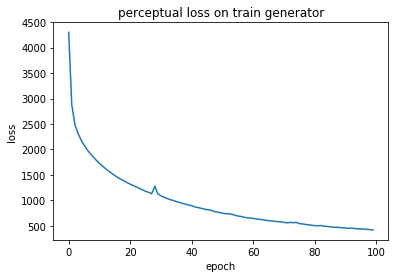

In [22]:
plt.plot(g_loss_p)
plt.title('perceptual loss on train generator')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

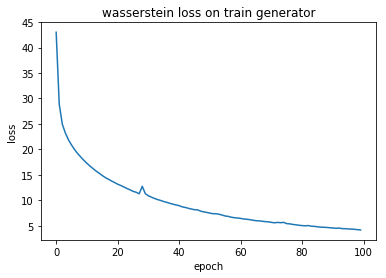

In [23]:
plt.plot(g_loss_w)
plt.title('wasserstein loss on train generator')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

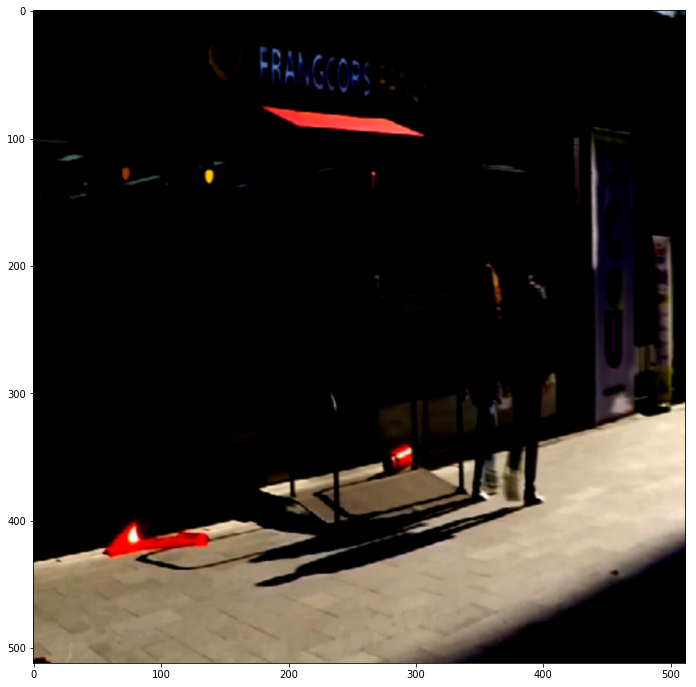

In [24]:
plt.figure(figsize=(12,12))
plt.imshow(x_train[2000], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

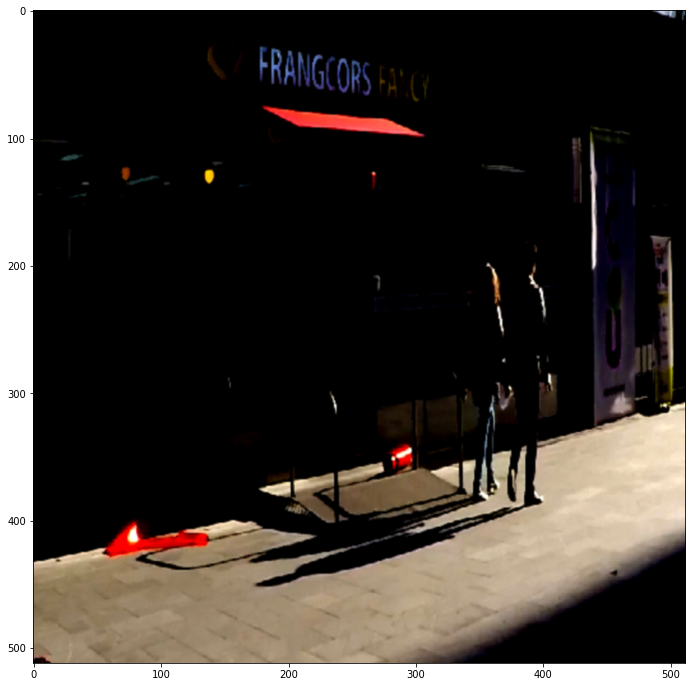

In [25]:
plt.figure(figsize=(12,12))
plt.imshow(y_train[2000], interpolation = 'bicubic')
plt.show

In [26]:
db = g.predict(x_train)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

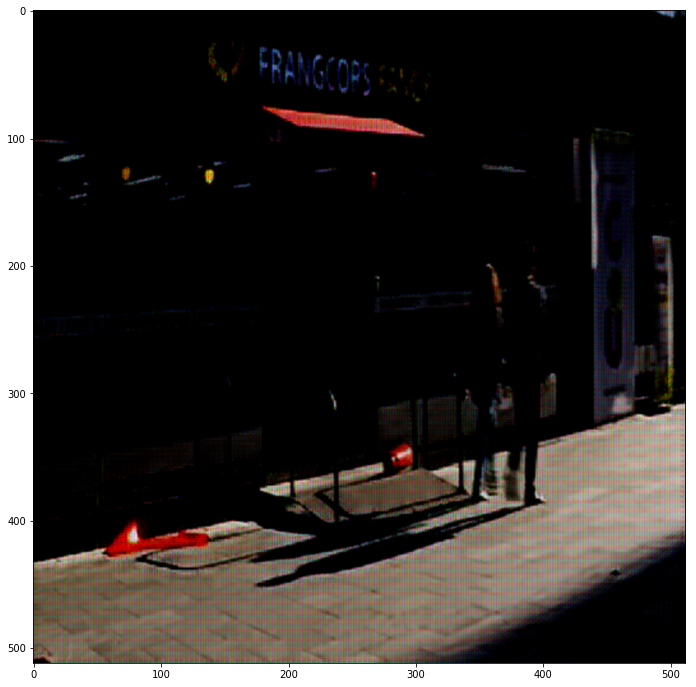

In [27]:
plt.figure(figsize=(12,12))
plt.imshow(db[2000], interpolation = 'bicubic')
plt.show

In [28]:
# serialize model to JSON
model_json = g.to_json()
with open("gan_512_300.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
g.save_weights("gan_512_300.h5")
print("Saved model to disk")

Saved model to disk


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

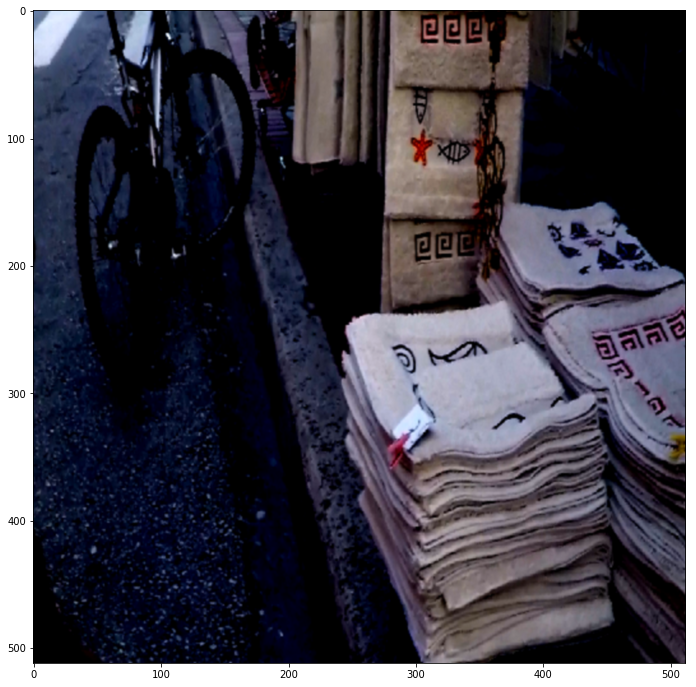

In [33]:
plt.figure(figsize=(12,12))
plt.imshow(y_train[200], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

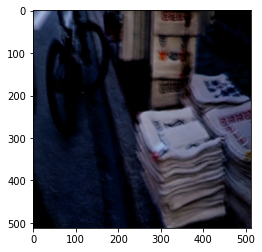

In [30]:
plt.imshow(db[200], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

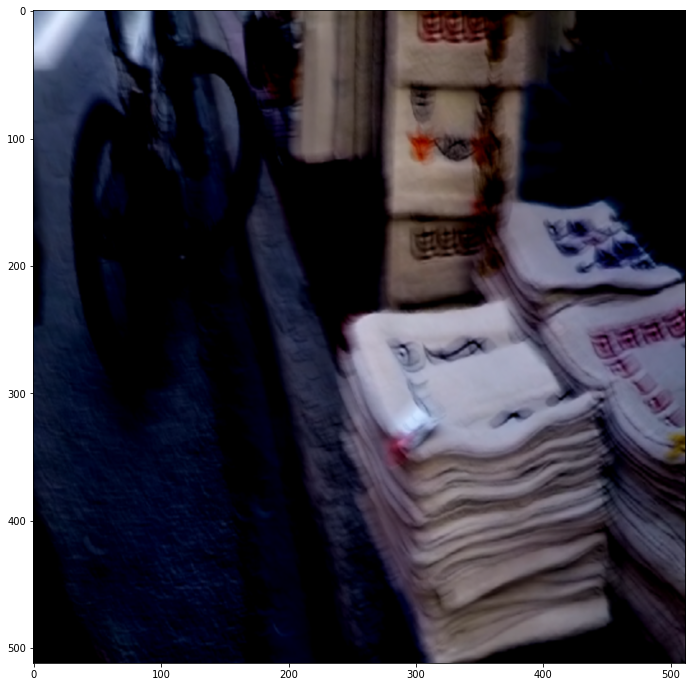

In [34]:
plt.figure(figsize=(12,12))
plt.imshow(x_train[200], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


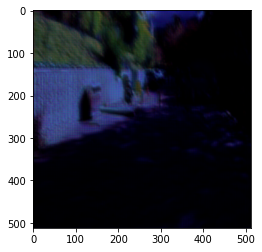

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


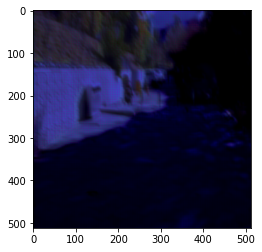

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


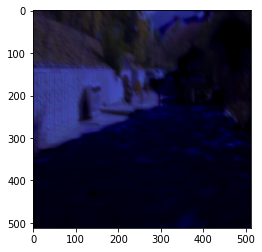

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


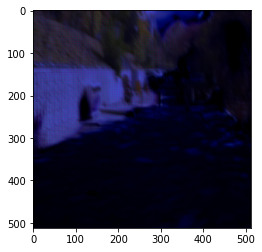

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


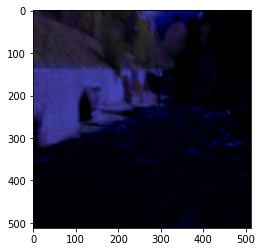

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


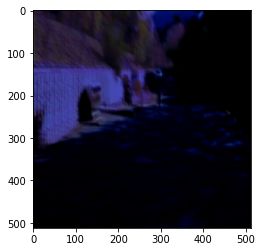

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


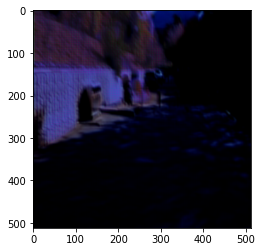

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


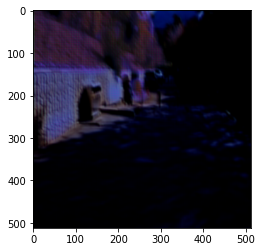

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


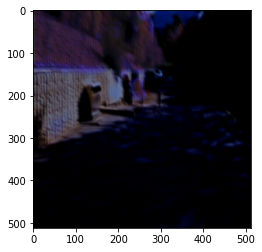

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


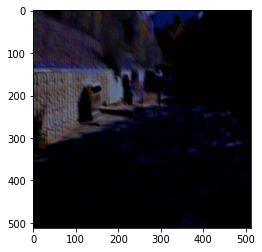

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


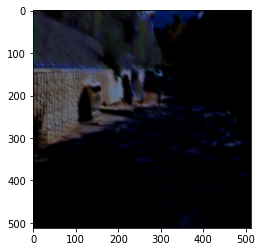

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


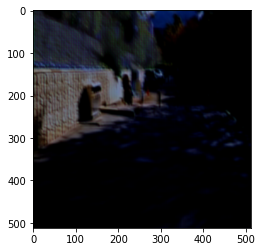

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


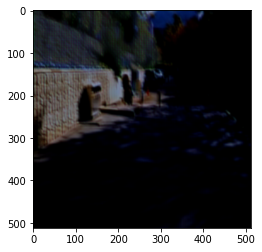

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


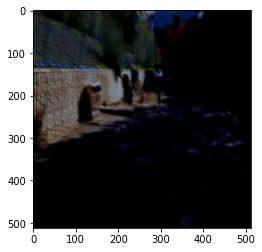

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


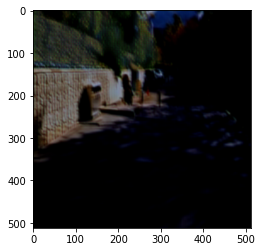

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


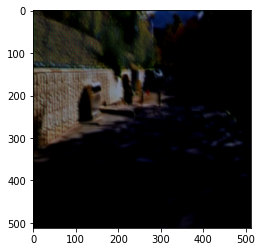

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


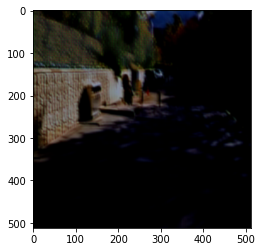

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


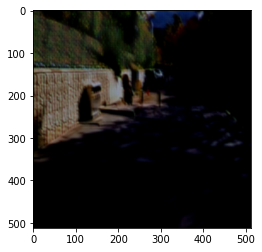

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


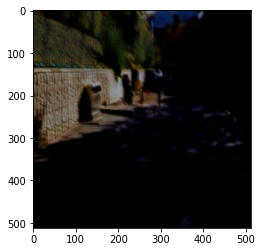

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


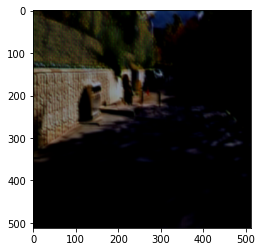

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


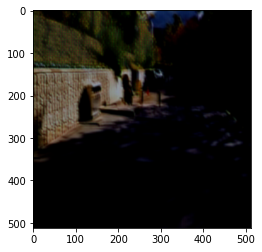

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


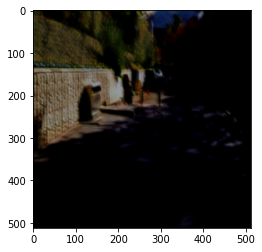

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


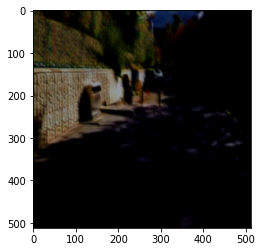

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


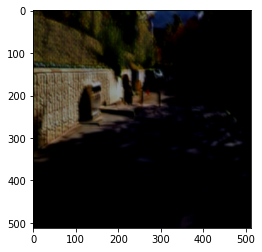

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


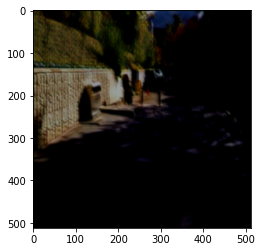

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


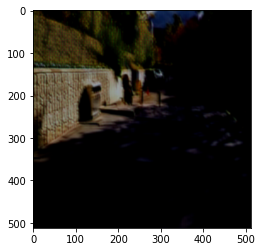

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


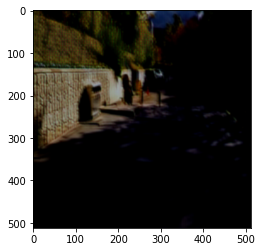

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


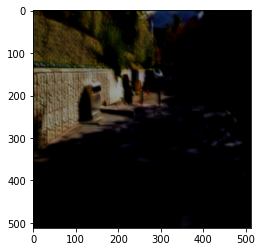

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


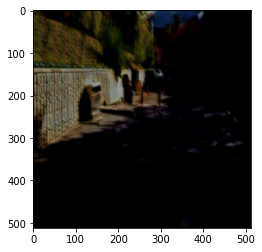

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


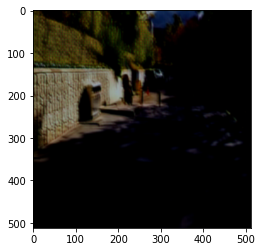

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


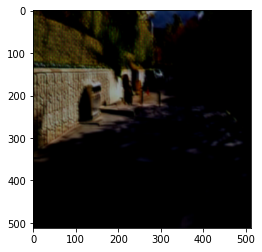

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


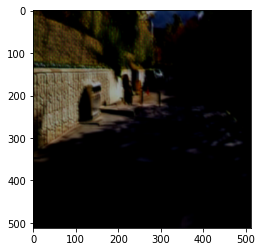

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


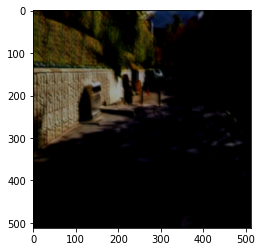

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


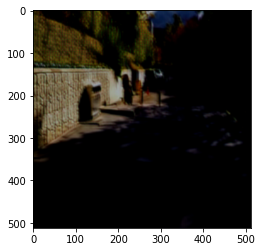

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


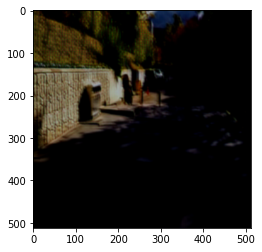

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


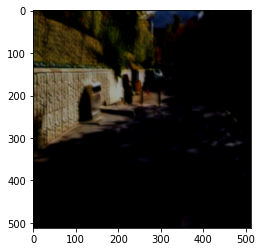

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


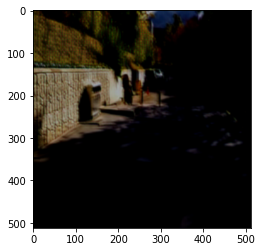

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


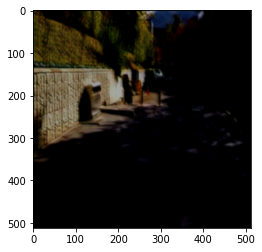

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


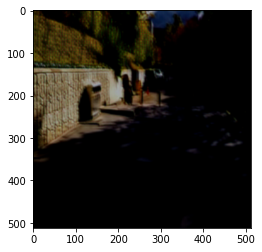

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


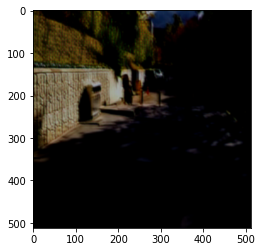

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


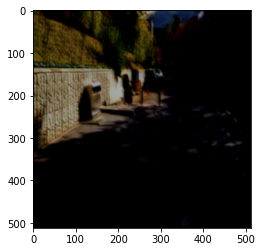

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


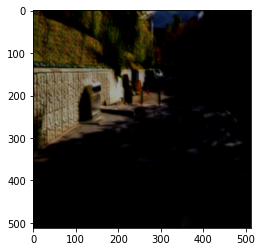

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


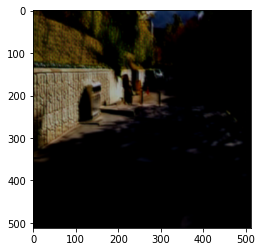

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


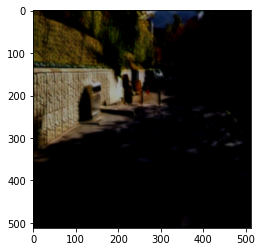

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


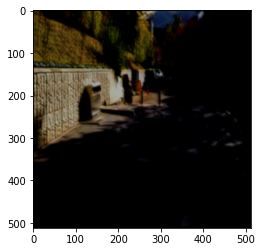

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


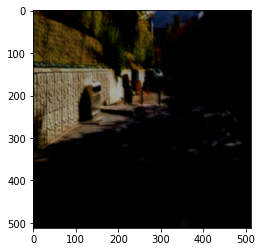

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


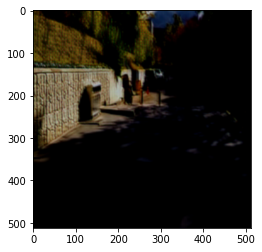

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


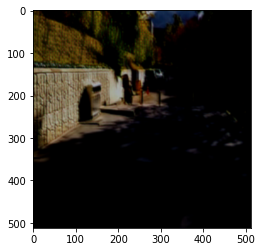

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


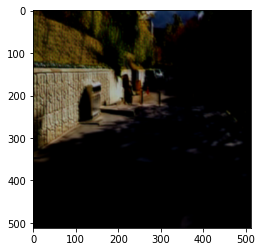

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


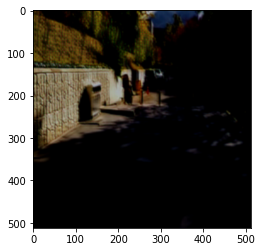

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


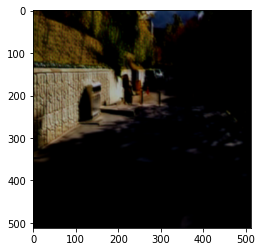

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


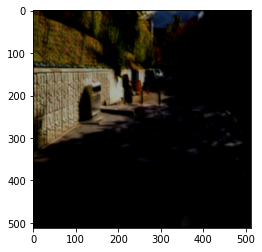

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


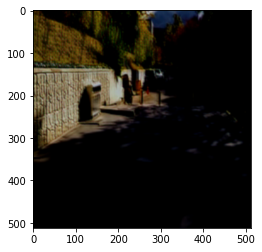

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


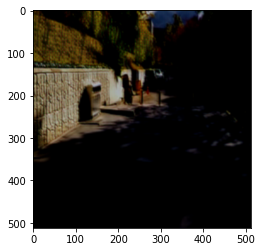

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


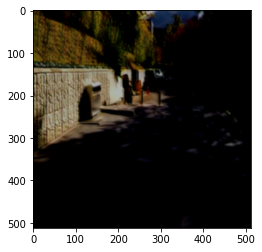

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


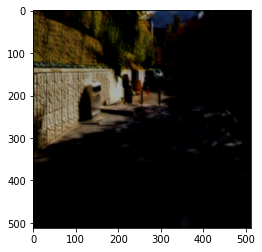

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


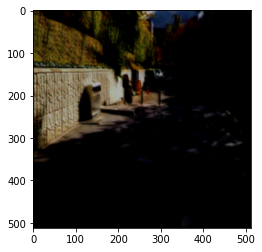

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


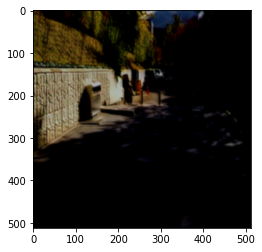

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


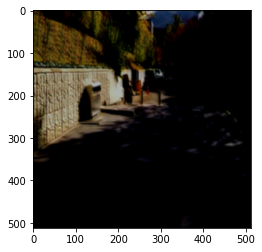

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


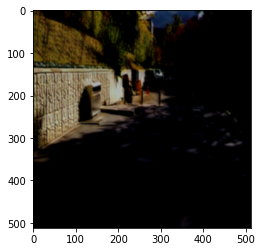

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


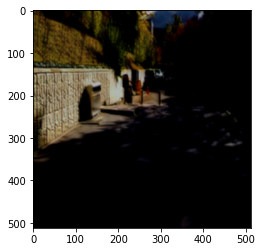

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


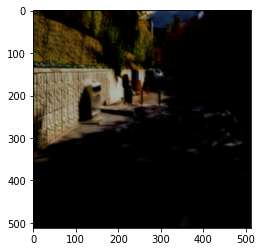

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


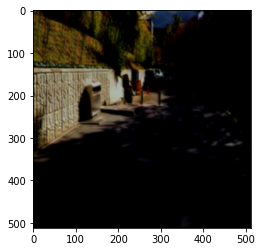

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


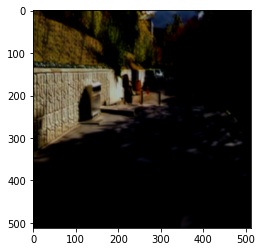

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


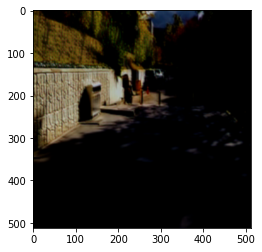

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


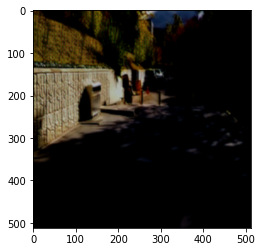

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


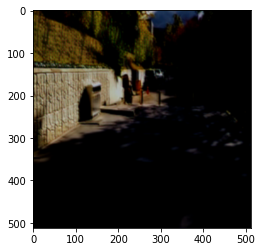

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


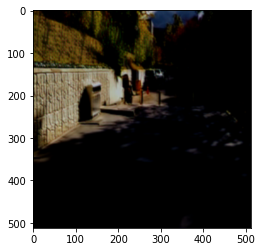

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


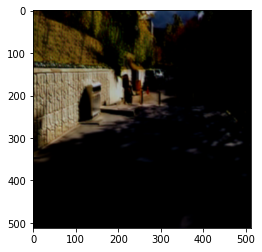

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


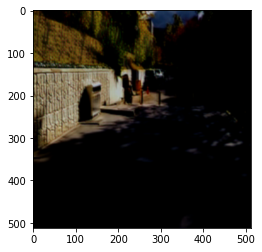

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


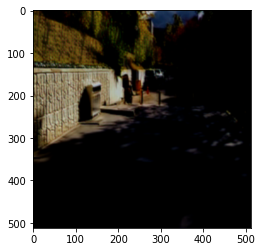

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


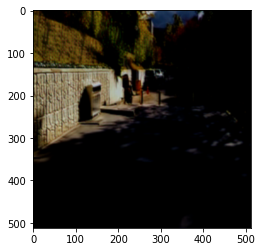

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


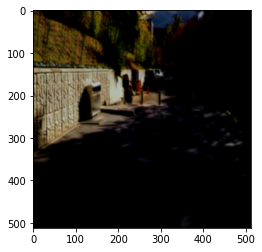

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


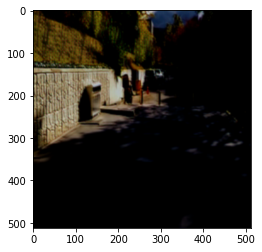

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


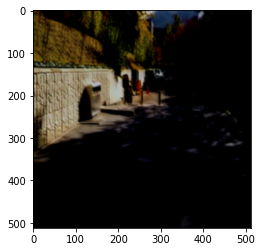

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


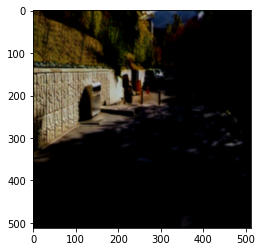

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


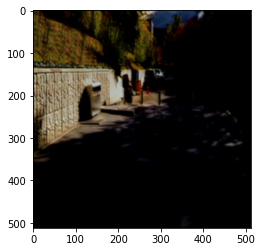

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


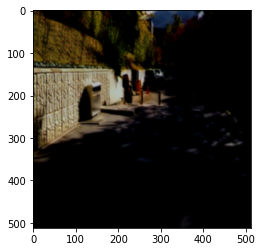

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


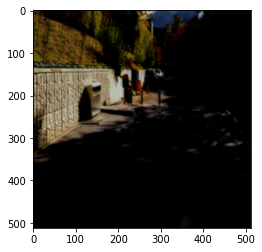

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


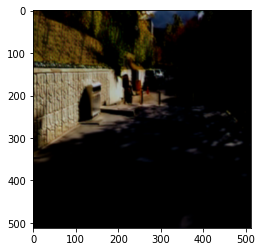

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


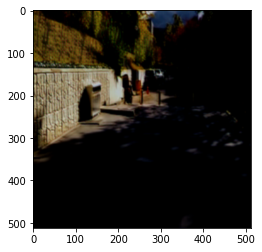

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


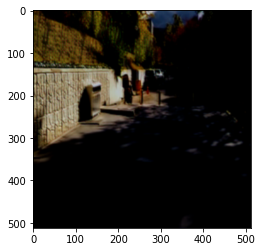

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


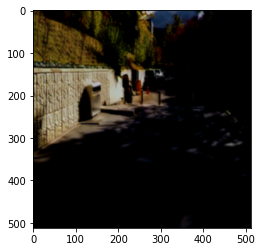

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


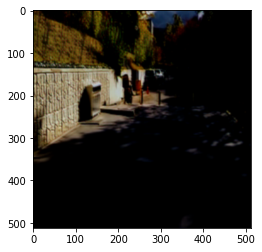

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


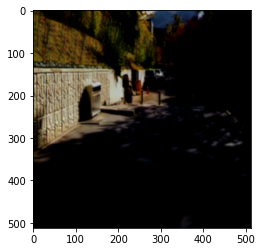

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


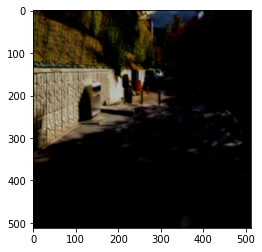

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


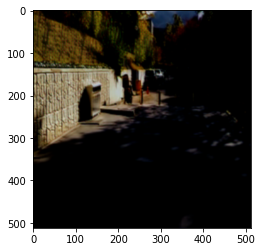

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


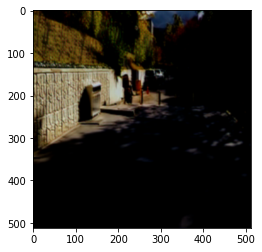

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


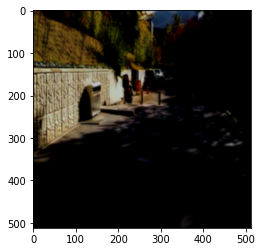

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


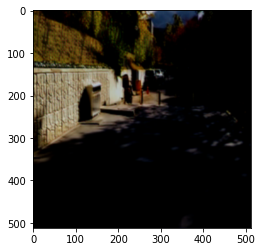

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


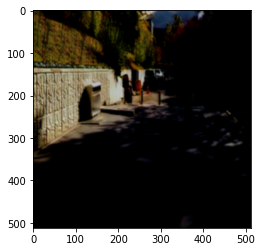

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


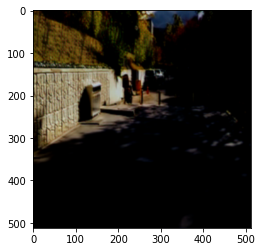

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


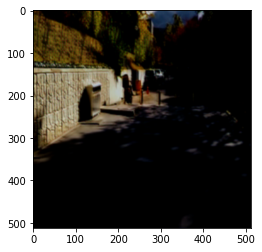

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


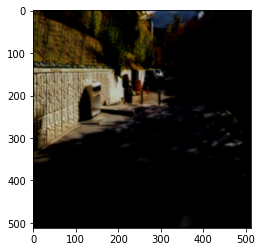

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


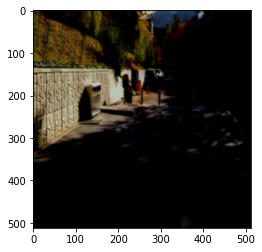

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


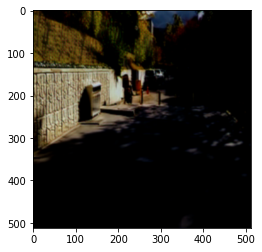

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


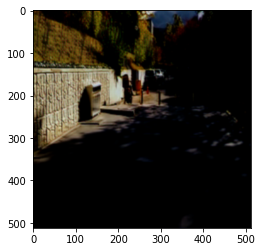

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


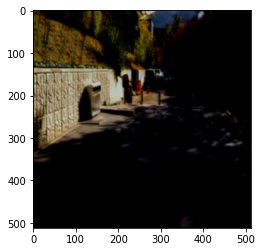

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


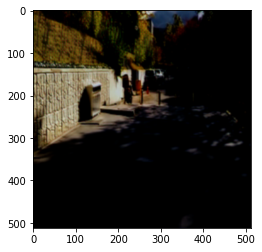

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


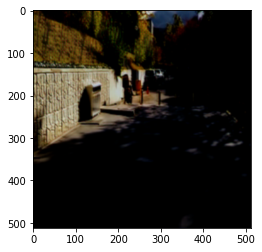

In [32]:
for i in range(100):
  plt.imshow(result[i], interpolation = 'bicubic')
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

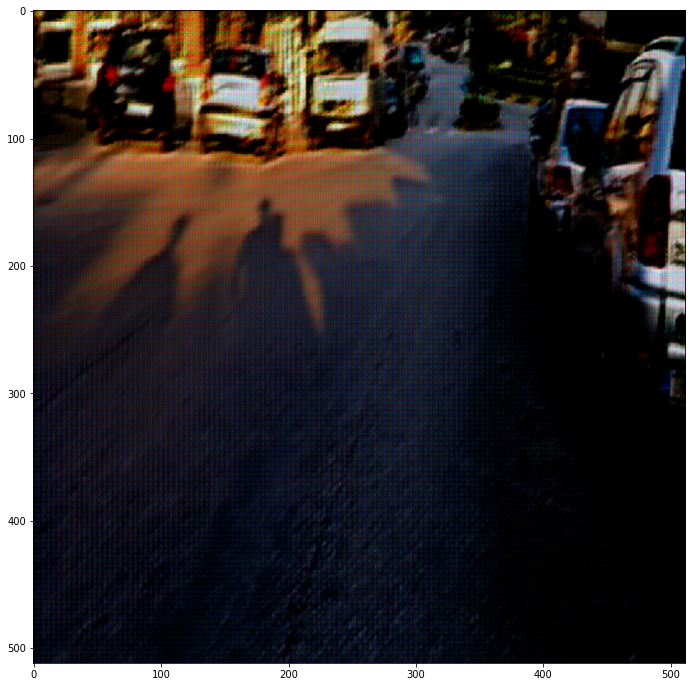

In [36]:
plt.figure(figsize=(12,12))
plt.imshow(db[101], interpolation = 'bicubic')
plt.show

In [37]:
n_images = 1013
data_test = load_images('./GoproAB/test', n_images)

In [38]:
y_test, x_test = data_test['B'], data_test['A']

In [39]:
ab = g.predict(x_test)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

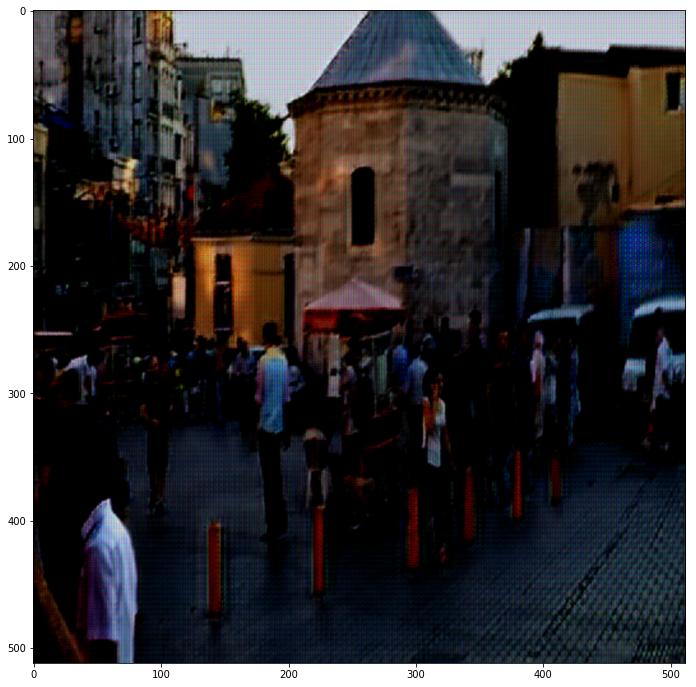

In [40]:
plt.figure(figsize=(12,12))
plt.imshow(ab[10], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

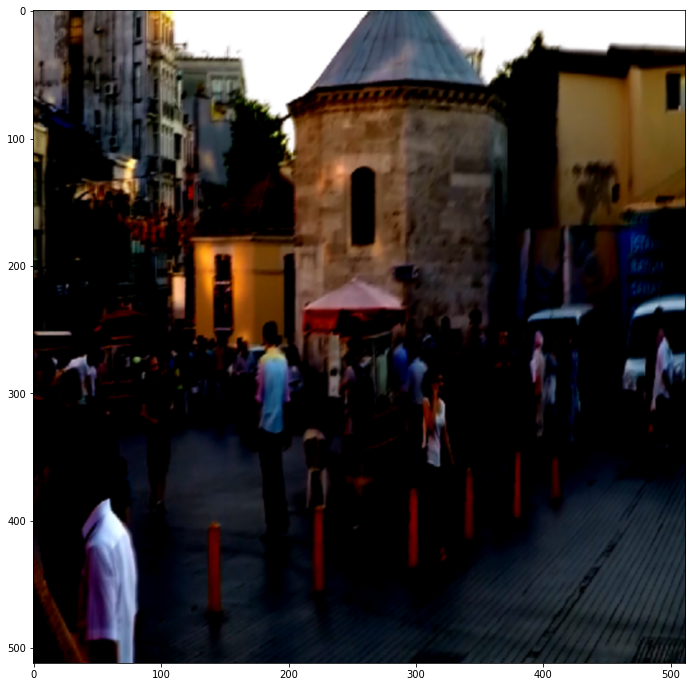

In [41]:
plt.figure(figsize=(12,12))
plt.imshow(x_test[10], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

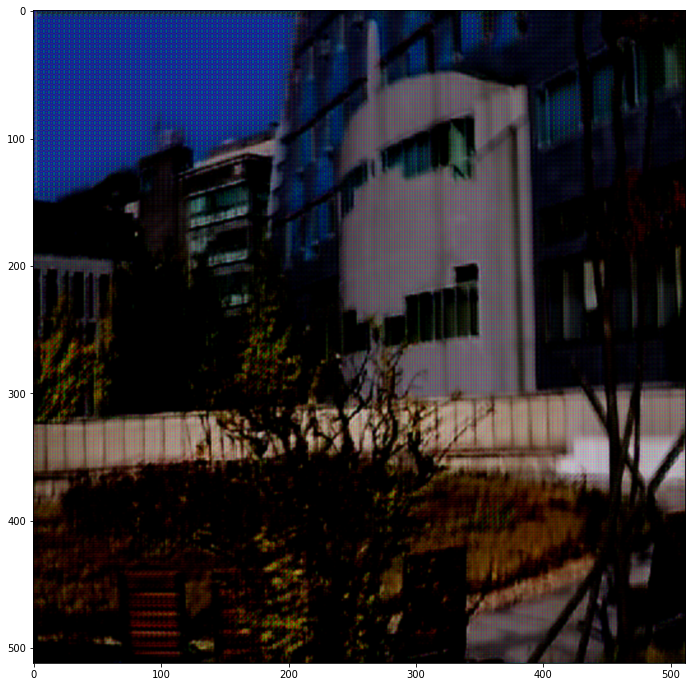

In [47]:
plt.figure(figsize=(12,12))
plt.imshow(ab[900], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

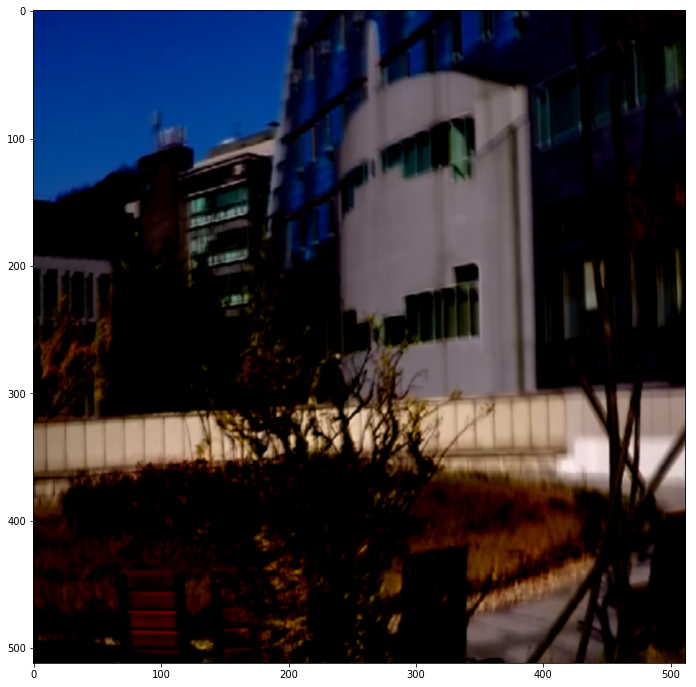

In [46]:
plt.figure(figsize=(12,12))
plt.imshow(x_test[900], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

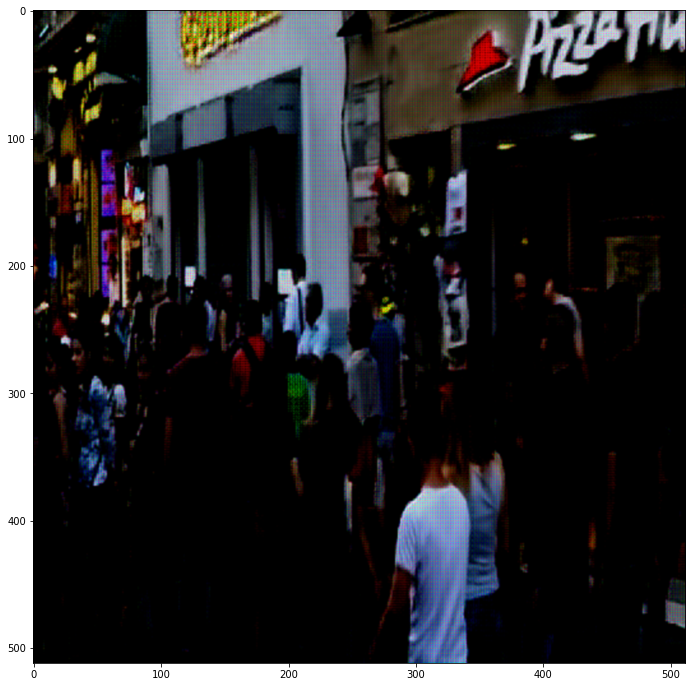

In [71]:
plt.figure(figsize=(12,12))
plt.imshow(ab[150], interpolation = 'bicubic')
plt.show

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<function matplotlib.pyplot.show(*args, **kw)>

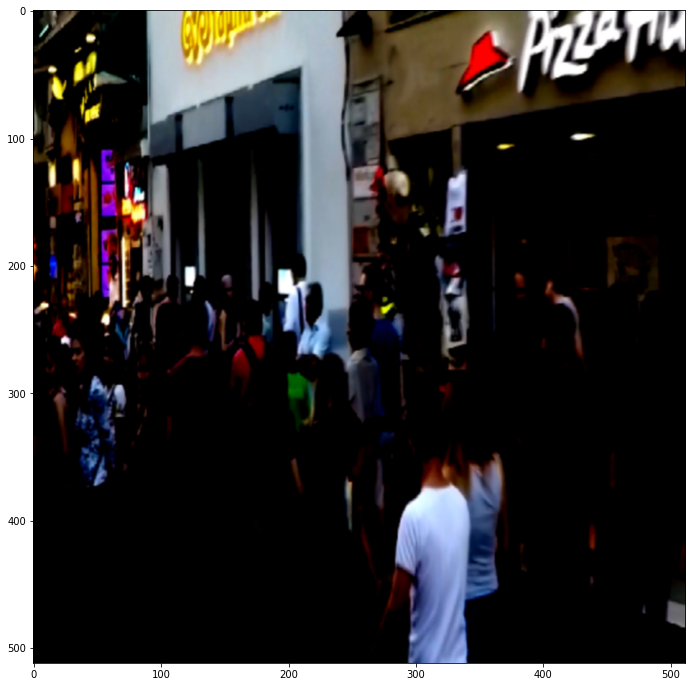

In [70]:
plt.figure(figsize=(12,12))
plt.imshow(x_test[150], interpolation = 'bicubic')
plt.show